<h1>Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Импорт-библиотек" data-toc-modified-id="Импорт-библиотек-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Импорт библиотек</a></span></li><li><span><a href="#Обзор-данных" data-toc-modified-id="Обзор-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Обзор данных</a></span></li><li><span><a href="#Загрузка-данных" data-toc-modified-id="Загрузка-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Загрузка данных</a></span></li><li><span><a href="#Метрика.-Описание" data-toc-modified-id="Метрика.-Описание-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Метрика. Описание</a></span></li><li><span><a href="#Распознавание-таблиц" data-toc-modified-id="Распознавание-таблиц-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Распознавание таблиц</a></span><ul class="toc-item"><li><span><a href="#Модель-NANONETSOCR" data-toc-modified-id="Модель-NANONETSOCR-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Модель NANONETSOCR</a></span><ul class="toc-item"><li><span><a href="#Установка-модели.-Пример-работы" data-toc-modified-id="Установка-модели.-Пример-работы-5.1.1"><span class="toc-item-num">5.1.1&nbsp;&nbsp;</span>Установка модели. Пример работы</a></span></li><li><span><a href="#Преобразование-распознанных-данных" data-toc-modified-id="Преобразование-распознанных-данных-5.1.2"><span class="toc-item-num">5.1.2&nbsp;&nbsp;</span>Преобразование распознанных данных</a></span></li><li><span><a href="#Тестирование-на-всех-данных" data-toc-modified-id="Тестирование-на-всех-данных-5.1.3"><span class="toc-item-num">5.1.3&nbsp;&nbsp;</span>Тестирование на всех данных</a></span></li></ul></li><li><span><a href="#Вывод:" data-toc-modified-id="Вывод:-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Вывод:</a></span></li></ul></li><li><span><a href="#Итоговый-вывод" data-toc-modified-id="Итоговый-вывод-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Итоговый вывод</a></span></li></ul></div>

# Распознавание таблиц с медицинских справок для DonorSearch

**Цель:** автоматизировать перенос данных с фотографий медицинских справок донора в формат .csv.

**Задача:** детектировать табличную часть справки, распознать текст и привести данные к требуемому шаблону

## Импорт библиотек

In [1]:
#!pip install opencv-python -q  

In [2]:
import pandas as pd
import cv2
import os
import re
from re import search
import time
from os import listdir
from PIL import Image as PImage

import numpy as np
import matplotlib.pyplot as plt

## Обзор данных

In [3]:
t=pd.read_csv('data/405/target/141899.csv')
t.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29 entries, 0 to 28
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   ID                       29 non-null     int64 
 1   ID пользователя          29 non-null     int64 
 2   Класс крови              29 non-null     object
 3   Дата донации             29 non-null     object
 4   Дата добавления донации  29 non-null     object
 5   Тип донации              29 non-null     object
 6   Регион                   29 non-null     object
 7   Место стадчи             29 non-null     int64 
 8   Статус донации           29 non-null     object
 9   Есть справка             29 non-null     object
dtypes: int64(3), object(7)
memory usage: 2.4+ KB


In [4]:
t=pd.read_csv('data/405/target/204119.csv')
t.head(14)

,ID,ID пользователя,Класс крови,Дата донации,Дата добавления донации,Тип донации,Регион,Место стадчи,Статус донации,Есть справка
0,170415,204119,Цельная кровь,01.04.2015,23.12.2022,Безвозмездно,"Россия, Тульская область, Тула",556,Принята,Да
1,170430,204119,Цельная кровь,27.07.2017,23.12.2022,Безвозмездно,"Россия, Тульская область, Кимовск",Выездная акция,Принята,Да
2,170431,204119,Цельная кровь,11.10.2017,23.12.2022,Безвозмездно,"Россия, Тульская область, Кимовск",Выездная акция,Принята,Да
3,170432,204119,Цельная кровь,30.07.2018,23.12.2022,Безвозмездно,"Россия, Тульская область, Кимовск",Выездная акция,Принята,Да
4,170433,204119,Цельная кровь,16.10.2018,23.12.2022,Безвозмездно,"Россия, Тульская область, Кимовск",Выездная акция,Принята,Да
5,170434,204119,Цельная кровь,15.10.2019,23.12.2022,Безвозмездно,"Россия, Тульская область, Кимовск",Выездная акция,Принята,Да


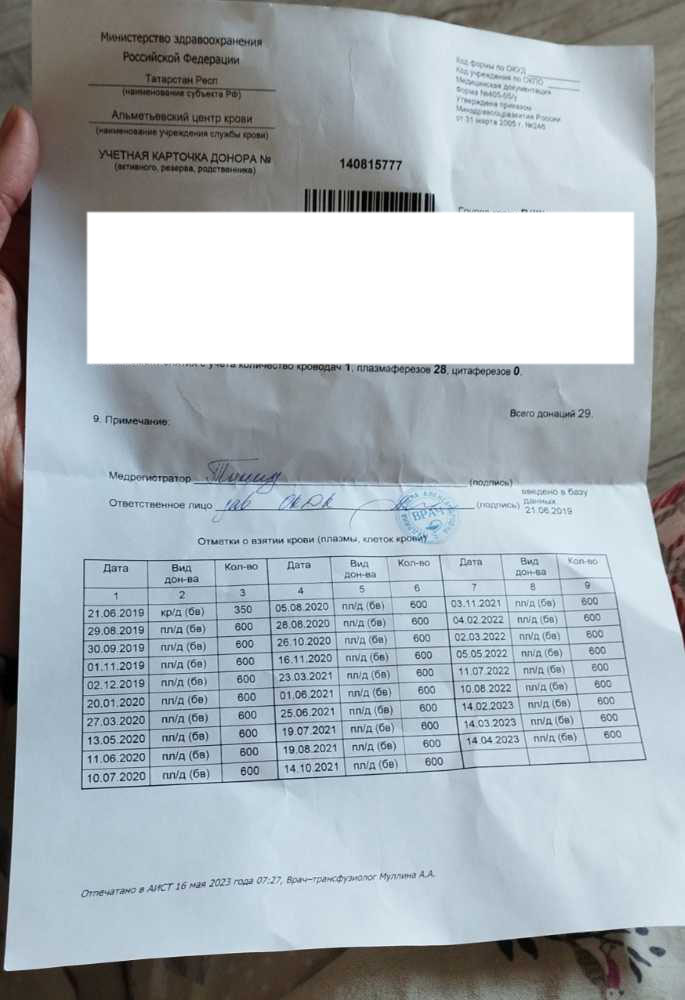

In [5]:
img = PImage.open('C:/Users/zoika/OneDrive/Рабочий стол/YP ds54/Practika/OCR_Donor_search/data/405/scan/141899 .jpg')
img

Мы видим, что нам необходимо заполнить с картинки не все колонки, а только 'Класс крови','Дата донации','Тип донации','Регион','Место стадчи'. Пропусков не обнаружено. Даты не в формате дат. Также, есть несоответствие в названиях и то, что значение одной колонки на картинке, в целевой табличке разбито на две:


In [6]:
df_info = { 'Дано на фото:  Вид дон-ва': ['кр / д ( бв )', 'пл / д ( бв ), пп / д ( бв ), п / ф ( бв )', 'т / ф ( бв ), ц / д ( бв )'],
          'Должны получить в csv: Класс крови': ['Цельная кровь', 'Плазма', 'Тромбоциты'],
           'Тип донации': ['Безвозмездно', 'Безвозмездно', 'Безвозмездно'] }
df_info = pd.DataFrame(df_info)
df_info

,Дано на фото: Вид дон-ва,Должны получить в csv: Класс крови,Тип донации
0,кр / д ( бв ),Цельная кровь,Безвозмездно
1,"пл / д ( бв ), пп / д ( бв ), п / ф ( бв )",Плазма,Безвозмездно
2,"т / ф ( бв ), ц / д ( бв )",Тромбоциты,Безвозмездно


Выявлены возможные сокращения:

**Класс крови:**
- Цельная кровь = [кр / д]
- Плазма = [пл / д, пп / д, п / ф]
- Тромбоциты = [т / ф, ц / д]


**Тип донации:**
-  Безвозмездно = [( бв )]


Учтем это в дальнейшей работе

## Загрузка данных 

Чтобы было удобно прогонять сразу все данные через модель и оценивать качество распознавания - объединим все картинки и соответствующие им таргеты (файлы .csv) в одном датафрейме.

Для этого напишем функцию, которая принимает на вход путь с расположением картинок и путь с расположением целевых таблиц. 
На выходе будет датафрейм, сопоставляющий для каждой картинки: имя объекта, путь для каждой картинки (необходимо для библиотки нанонетс),саму картинку, и соответствующий ей таргет (файл csv). 

Внутри функции, из csv-файлов будут удалены лишние столбцы, которые нет необходимости заполнять на основании картинки.

In [7]:
path='data/405/scan/'  #у меня картинки в отдельной папке scan, ноут в одной папке с data...
path_csv='data/405/target/'

def loadImages(path,path_csv):

    imagesList = listdir(path)
    loadedImages = []
    for image in imagesList:
       
        img = PImage.open(path + image)
        path_jpg=path + image
        #img=np.array(img)/255
        
        name=str(image)
        name=name.split(' ')[0]
        name=re.sub(r'(.jpg)', '', name)
        
        target=pd.read_csv(path_csv + name + '.csv')
        target=target[['Класс крови','Дата донации','Тип донации']] #,'Регион','Место стадчи'
        
        list=[name,img,path_jpg,target]
        loadedImages.append(list)   
        
        df=pd.DataFrame(loadedImages, columns = ['name','input_image','path_jpg','target_csv'])
        df=df.set_index('name')

    return df

df = loadImages(path,path_csv)
df.head(3)

,input_image,path_jpg,target_csv
name,,,
141899,<PIL.JpegImagePlugin.JpegImageFile image mode=...,data/405/scan/141899 .jpg,Класс крови Дата донации Тип донации 0...
204119,<PIL.JpegImagePlugin.JpegImageFile image mode=...,data/405/scan/204119 .jpg,Класс крови Дата донации Тип донации 0 ...
213950,<PIL.JpegImagePlugin.JpegImageFile image mode=...,data/405/scan/213950.jpg,Класс крови Дата донации Тип донации 0...


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15 entries, 141899 to 256838
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   input_image  15 non-null     object
 1   path_jpg     15 non-null     object
 2   target_csv   15 non-null     object
dtypes: object(3)
memory usage: 480.0+ bytes


In [9]:
df['target_csv']['204119'].info()  #обращение к целевой таблице

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Класс крови   6 non-null      object
 1   Дата донации  6 non-null      object
 2   Тип донации   6 non-null      object
dtypes: object(3)
memory usage: 272.0+ bytes


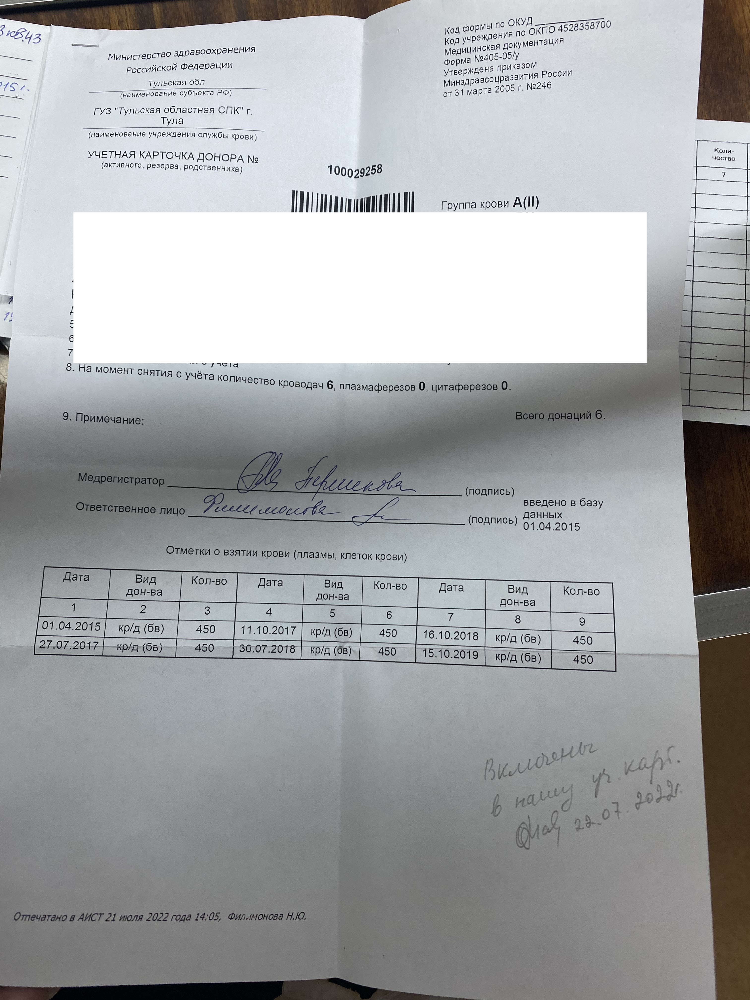

In [10]:
df['input_image']['204119']   #обращение к картинке

На данном этапе мы загрузили и сопоставили все, имеющиеся данные. Проверили, что все 15 изображений на месте. Пропусков, нулей - нет.

## Метрика. Описание
Чтобы можно было оценивать и сравнивать различные модели или их модификации - нужна метрика.
Поэтому напишем функцию, которая будет считать аналог accuracy для таблиц. А именно, считать и выводить - долю, правильно распознанных ячеек.

In [11]:
def metric_acc(df_pred,df_target):
    
    count=0
    count_good=0
    
    for j in range(df_target.shape[1]):
        for i in range(df_target.shape[0]):
            try:
                if df_target.iloc[i,j]==df_pred.iloc[i,j]:
                    count_good+=1
                    count+=1
                else: count+=1
            except:count+=1
    print('Всего ячеек:',count,'. Верных:',count_good, '. Acc:',count_good/count)
    return count_good/count

## Распознавание таблиц

**Гипотеза №1:** с помощью библиотеки NANONETSOCR удастся распознать не менее 75% табличных данных (колонки: 'Класс крови','Дата донации','Тип донации')

###  Модель NANONETSOCR
Данная модель способна сразу выделить на изображении таблицу и распознать.

Загрузка библиотек и самой модели:

####  Установка модели. Пример работы

In [12]:
#!pip install ocr-nanonets-wrapper -q

In [13]:
from nanonets import NANONETSOCR
model = NANONETSOCR()
model.set_token('REPLACE_API_KEY') #ключ генерируется в личном кабинете на сайте https://nanonets.com

Проверим работу модели на примере произвольной картинки.
Картинка:

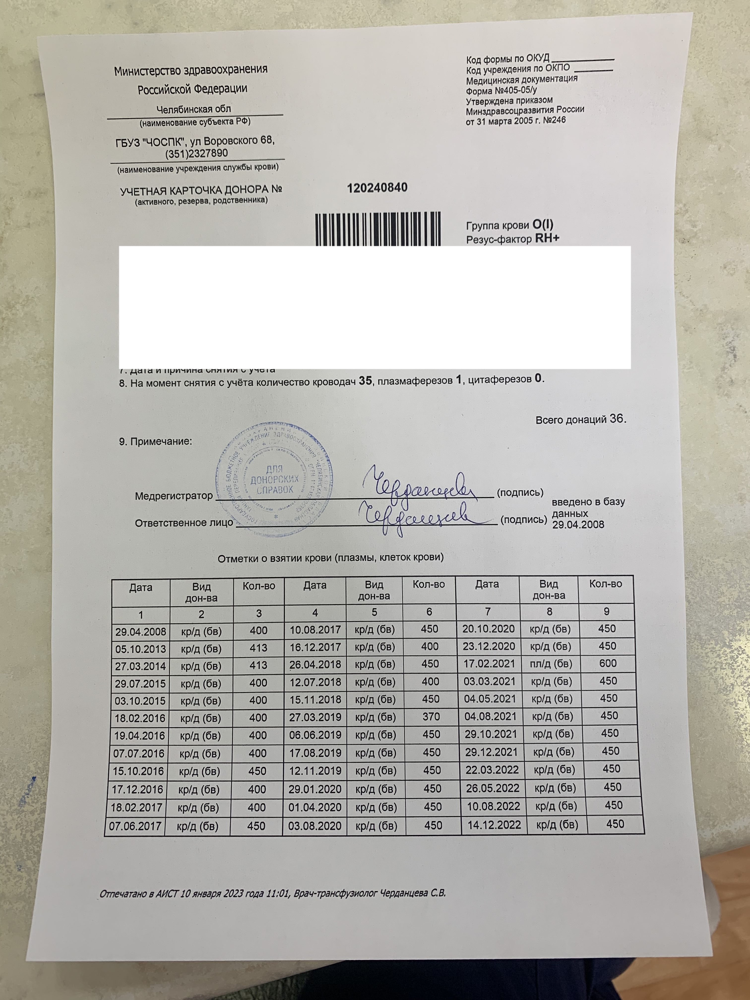

In [26]:
num_img_test='238716' #выберем произвольный номер картинки (строки в дф) 
df['input_image'][num_img_test]

Используем метод convert_to_csv для данной картинки и выведем результат:

In [27]:
%%time
model.convert_to_csv(df['path_jpg'][num_img_test],output_file_name='OUTPUTFILE.csv')
test_NANO=pd.read_csv('OUTPUTFILE.csv')
test_NANO

CPU times: total: 62.5 ms
Wall time: 23.2 s


,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,TABLE 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,Дата,Вид\nдон - ва,Кол - во,Дата,Вид\nдон - ва,Кол - во,Дата,Вид\nдон - ва,Кол - во
3,NaN,1,2,3,4,5,6,7,8,9
4,NaN,29.04.2008,кр / д ( бв ),400,10.08.2017 |,кр / д ( бв ),450,20.10.2020,кр / д ( бв ),450
5,NaN,05.10.2013,кр / д ( бв ),413,16.12.2017 |,кр / д ( бв ),400,23.12.2020,кр / д ( бв ),450
6,NaN,27.03.2014,кр / д ( бв ),413,26.04.2018 |,кр / д ( бв ),450,17.02.2021,пл / д ( бв ),600
7,NaN,29.07.2015,кр / д ( бв ),400,12.07.2018 |,кр / д ( бв ),400,03.03.2021,кр / д ( бв ),450
8,NaN,03.10.2015,кр / д ( бв ),400,15.11.2018,| кр / д ( бв ),450,04.05.2021,кр / д ( бв ),450
9,NaN,18.02.2016,кр / д ( бв ),400,27.03.2019 |,кр / д ( бв ),370,04.08.2021,кр / д ( бв ),450


Даже на примере размытой картинки мы видим, что модель смогла выделить таблицу и верно оперделить больше половины числовых значений. 

Однако, много лишней информации и последовательность колонок отличается от целевой. Чтобы это исправить и привести данные как можно ближе к требованиям заказчика, напишем специальную функцию в следующем пункте.

####  Преобразование распознанных данных

In [28]:
def df_transform(df):

 # Чистка таблицы ---------------------------------------------------------   

    df = df.applymap(lambda cell: cell.lower() if isinstance(cell, str) else cell)
    df = df.applymap(lambda cell: cell.replace('|', '') if isinstance(cell, str) else cell)

# Создадим новый дф перенесем в него данные в нужном порядке   --------------------------------------------------

    df_new=pd.DataFrame(columns=['Класс крови','Дата донации','Тип донации','Регион','Место стадчи','Кол-во'])
    
    i_new=0
    
    for j in range(df.shape[1]):
        for i in range((df.shape[0])):
       
            if (df.iloc[i,j]=='дата') or (df.iloc[i,j]=='dara'):  # Доработать/  содержит д/d/ ата
                for i in range(i,df.shape[0]-2):
                    
                    stroka_df_new=[]
                    
               # Класс крови-------------------------------------
            
                    massiv  = '(?:{})'.format('|'.join(['k','ka','кр','к'])) #'Цельная кровь'
                    massiv1 = '(?:{})'.format('|'.join(['т / ф', 'ц / д','т/ф', 'ц/д','t / ф'])) #тромбоциты
                    massiv2 = '(?:{})'.format('|'.join(['пл/д', 'пл/ д','пл / д', 'пл /д','п / ф' \
                                                        ,'п/ф','п /ф','п/ ф','пп/д','пп / д'])) #Плазма
                    
                    if  search(massiv, str(df.iloc[i+2,j+1])):
                        stroka_df_new.append('Цельная кровь') 
                    elif search(massiv1, str(df.iloc[i+2,j+1])):
                        stroka_df_new.append('Тромбоциты')
                    elif search(massiv2, str(df.iloc[i+2,j+1])):
                        stroka_df_new.append('Плазма')                        
                    else:stroka_df_new.append('unknown') 
                    
              # !!!!!!Алла, можешь доработать ниже
              #  Дата донации-------------------------------------       
                    stroka_df_new.append(df.iloc[i+2,j])      
              
            
            
            
             # Тип донации---------------------------------------- 
            
                    if search('плат',str(df.iloc[i+2,j+1])):
                        stroka_df_new.append('Платно')
                    else:
                        stroka_df_new.append('Безвозмездно')
                        
                        
             #---------------------------------------------------------      
                    stroka_df_new.append('unknown')           # 'Регион'
                    stroka_df_new.append('unknown')           # 'Место стадчи'
                    stroka_df_new.append(df.iloc[i+2,j+2])    # Kol-vo

                    df_new.loc[i_new]=stroka_df_new
                    i_new+=1

    return df_new

In [29]:
df_test=df_transform(test_NANO)
df_test

,Класс крови,Дата донации,Тип донации,Регион,Место стадчи,Кол-во
0,Цельная кровь,29.04.2008,Безвозмездно,unknown,unknown,400
1,Цельная кровь,05.10.2013,Безвозмездно,unknown,unknown,413
2,Цельная кровь,27.03.2014,Безвозмездно,unknown,unknown,413
3,Цельная кровь,29.07.2015,Безвозмездно,unknown,unknown,400
4,Цельная кровь,03.10.2015,Безвозмездно,unknown,unknown,400
5,Цельная кровь,18.02.2016,Безвозмездно,unknown,unknown,400
6,Цельная кровь,19.04.2016,Безвозмездно,unknown,unknown,400
7,Цельная кровь,07.07.2016,Безвозмездно,unknown,unknown,400
8,Цельная кровь,15.10.2016,Безвозмездно,unknown,unknown,450
9,Цельная кровь,17.12.2016,Безвозмездно,unknown,unknown,400


Проверка метрики:

In [30]:
metric_acc(df_test,df['target_csv'][num_img_test])

Всего ячеек: 108 . Верных: 101 . Acc: 0.9351851851851852


0.9351851851851852

In [31]:
df['target_csv'][num_img_test]

,Класс крови,Дата донации,Тип донации
0,Цельная кровь,29.04.2008,Безвозмездно
1,Цельная кровь,05.10.2013,Безвозмездно
2,Цельная кровь,27.03.2014,Безвозмездно
3,Цельная кровь,29.07.2015,Безвозмездно
4,Цельная кровь,03.10.2015,Безвозмездно
5,Цельная кровь,18.02.2016,Безвозмездно
6,Цельная кровь,19.04.2016,Безвозмездно
7,Цельная кровь,07.07.2016,Безвозмездно
8,Цельная кровь,15.10.2016,Безвозмездно
9,Цельная кровь,17.12.2016,Безвозмездно


####  Тестирование на всех данных

In [32]:
%%time
def acc_all_nano(df):
    acc_list=[]
    for i, row in df.iterrows():
        print('file_name:',i)
        model.convert_to_csv(row['path_jpg'],output_file_name='OUTPUTFILE_for_metric.csv')
        nano_table=pd.read_csv('OUTPUTFILE_for_metric.csv')
        new_nano_table=df_transform(nano_table)
        acc=metric_acc(new_nano_table,row['target_csv'])
        acc_list.append(acc) 
    print('Метрика, усредненная:',sum(acc_list)/len(acc_list))
    return sum(acc_list)/len(acc_list)

acc_all_nano(df)

file_name: 141899
Всего ячеек: 87 . Верных: 53 . Acc: 0.6091954022988506
file_name: 204119
Всего ячеек: 18 . Верных: 18 . Acc: 1.0
file_name: 213950
Всего ячеек: 66 . Верных: 66 . Acc: 1.0
file_name: 225629
Всего ячеек: 54 . Верных: 49 . Acc: 0.9074074074074074
file_name: 227414
Всего ячеек: 60 . Верных: 36 . Acc: 0.6
file_name: 228963
Всего ячеек: 69 . Верных: 42 . Acc: 0.6086956521739131
file_name: 231820
Всего ячеек: 39 . Верных: 34 . Acc: 0.8717948717948718
file_name: 233749
Всего ячеек: 63 . Верных: 63 . Acc: 1.0
file_name: 236000
Всего ячеек: 15 . Верных: 15 . Acc: 1.0
file_name: 238716
Всего ячеек: 108 . Верных: 101 . Acc: 0.9351851851851852
file_name: 243478
Всего ячеек: 114 . Верных: 70 . Acc: 0.6140350877192983
file_name: 245365
Всего ячеек: 111 . Верных: 97 . Acc: 0.8738738738738738
file_name: 254586
Всего ячеек: 33 . Верных: 31 . Acc: 0.9393939393939394
file_name: 256578
Всего ячеек: 30 . Верных: 4 . Acc: 0.13333333333333333
file_name: 256838
Всего ячеек: 66 . Верных: 27 . 

0.766800377484772

0.766800377484772 - Метрика, усредненная по всем фото, без  'Регион','Место стадчи'

### Вывод:
В данном разделе:
- Проведено исследование модели NANONETSOCR
- Разработана функция постобработки распознанных данных
- Проведена оценка работоспособности полученного алгоритма

С помощью доработоной модели удалось получить более 75% точности распознавания и заполнения колонок
- 'Класс крови',
- 'Дата донации',
- 'Тип донации', 

которые заказчик обозначил, как самые важные и трудозатратные. Таким образом, гипотеза №1 - подтвердилась.

Время полного цикла преобразований одного изображения занимает от 10 до 30 секунд.

## Итоговый вывод